This work is based on **[Kaggle competition](https://www.kaggle.com/competitions/store-sales-time-series-forecasting)**.
<br>
<br>
This is the **EDA (1st)** part of the project (that consists of 2 notebooks). Key steps that are presented in this part:
- **Data overview**
- **Merging**
- **Data cleaning / Misleading data detection & handling**
- **Feature engineering**
- **Visual analysis**
- **Datasets creation & writing**

## About the data

Data comes from <b>Corporación Favorita</b>, a large Ecuadorian-based grocery retailer.

<div style="text-align: center;">
    <img src="https://upload.wikimedia.org/wikipedia/commons/0/0f/Corporaci%C3%B3n_Favorita_Logo.png" 
        alt="Favorita Logo" style="width: 500px; height: auto;">
</div>
    

**There are total of 7 datasets:**
1. **train.csv**
    - The training data, comprising time series of features *store_nbr*, *family*, and *onpromotion* as well as the *target sales*.
    
        1.1. *store_nbr* identifies the store at which the products are sold.
    
        1.2. *family* identifies the type of product sold.
    
        1.3. *sales* gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).
    
        1.4. *onpromotion* gives the total number of items in a product family that were being promoted at a store at a given date. <br><br>

2. **test.csv**
    - The test data, having the same features as the training data.
    - The dates in the test data are for the 16 days after the last date in the training data.<br><br>
    
3. **sample_submission.csv**
    - A sample submission file in the correct format.<br><br>
4. **stores.csv**
    - Store metadata, including city, state, type, and cluster.
    - *cluster* is a grouping of similar stores.<br><br>
5. **oil.csv**
    - Daily oil price. Includes values during both the train and test data timeframes. (Ecuador is an oil-dependent country and it's economical health is highly vulnerable to shocks in oil prices).<br><br>
6. **holidays_events.csv**
    - Holidays and Events, with metadata.
    - NOTE: Pay special attention to the transferred column. A holiday that is transferred officially falls on that calendar day, but was moved to another date by the government. A transferred day is more like a normal day than a holiday. To find the day that it was actually celebrated, look for the corresponding row where type is Transfer. For example, the holiday Independencia de Guayaquil was transferred from 2012-10-09 to 2012-10-12, which means it was celebrated on 2012-10-12. Days that are type Bridge are extra days that are added to a holiday (e.g., to extend the break across a long weekend). These are frequently made up by the type Work Day which is a day not normally scheduled for work (e.g., Saturday) that is meant to payback the Bridge.
    - Additional holidays are days added a regular calendar holiday, for example, as typically happens around Christmas (making Christmas Eve a holiday).<br><br>
7. **transactions.csv**
    - data about transactions made by each store.

## Libraries, data loading and plot settings

In [3]:
import numpy as np
import pandas as pd

from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import missingno as msno

import warnings

In [4]:
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = (12, 7)

In [5]:
train = pd.read_csv('initial_datasets/train.csv', index_col=0, parse_dates=['date'])
test = pd.read_csv('initial_datasets/test.csv', index_col=0, parse_dates=['date'])

## Basic overview of train and test datasets

In [6]:
train.head(3)

,date,store_nbr,family,sales,onpromotion
id,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,2013-01-01,1,BABY CARE,0.0,0
2,2013-01-01,1,BEAUTY,0.0,0


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype         
---  ------       -----         
 0   date         datetime64[ns]
 1   store_nbr    int64         
 2   family       object        
 3   sales        float64       
 4   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 137.4+ MB


In [8]:
def entrances_check(col):
    if set(train[col]) == set(test[col]):
        print(f'Unique {col} values in training dataset match such values in testing one.',
              f'There are total of {train[col].nunique()} such unique entrances in each dataset.', sep='\n')
    else:
        print(f'Unique {col} values in training dataset don\'t match such values in testing one.',
             f'There are {train[col].nunique()} unique entrances in training dataset',
             f'and {test[col].nunique()} in testing dataset', sep='\n')

In [9]:
for i, col in enumerate(['store_nbr', 'family']):
    entrances_check(col)
    if i + 1 < len(['store_nbr', 'family']):
        print()

Unique store_nbr values in training dataset match such values in testing one.
There are total of 54 such unique entrances in each dataset.

Unique family values in training dataset match such values in testing one.
There are total of 33 such unique entrances in each dataset.


In [10]:
print(f'Number of missing values in training data: {train.isna().sum().sum()}')
print(f'Number of missing values in testing data: {test.isna().sum().sum()}')

Number of missing values in training data: 0
Number of missing values in testing data: 0


In [11]:
print(f'Number of duplicates in training data: {train.duplicated().sum()}')
print(f'Number of duplicates in testing data: {test.duplicated().sum()}')

Number of duplicates in training data: 0
Number of duplicates in testing data: 0


In [12]:
date_train_start = train.date.iloc[0]
date_train_end = train.date.iloc[-1]

date_test_start = test.date.iloc[0]
date_test_end = test.date.iloc[-1]

In [13]:
print(f'Training period starts on {date_train_start.strftime("%Y-%m-%d")}')
print(f'Lasts for {(date_train_end - date_train_start).days + 1} days')
print(f'And ends on {date_train_end.strftime("%Y-%m-%d")}', end='\n\n')

print(f'Testing period starts on {date_test_start.strftime("%Y-%m-%d")}')
print(f'Lasts for {(date_test_end - date_test_start).days + 1} days')
print(f'And ends on {date_test_end.strftime("%Y-%m-%d")}')

Training period starts on 2013-01-01
Lasts for 1688 days
And ends on 2017-08-15

Testing period starts on 2017-08-16
Lasts for 16 days
And ends on 2017-08-31


In [14]:
train['family'] = train['family'].map(lambda x: x.capitalize())
test['family'] = test['family'].map(lambda x: x.capitalize())

## Oil dataset

In [15]:
oil = pd.read_csv('initial_datasets/oil.csv', parse_dates=['date'], index_col='date')
oil = oil.rename(columns={'dcoilwtico': 'oil_price'})
oil = oil.resample('1D').asfreq().interpolate('linear').reset_index()

In [16]:
oil

,date,oil_price
0,2013-01-01,92.480000
1,2013-01-02,93.140000
2,2013-01-03,92.970000
3,2013-01-04,93.120000
4,2013-01-05,93.146667
...,...,...
1699,2017-08-27,46.816667
1700,2017-08-28,46.400000
1701,2017-08-29,46.460000
1702,2017-08-30,45.960000


In [17]:
x1, y1 = oil[oil.date <= date_train_end].values.T
x2, y2 = oil[oil.date >= date_test_start].values.T

fig = go.Figure(data=[
    go.Scatter(x=x1, y=y1, name='Training period', line={'color':'teal'}, fill='tozeroy', fillcolor='aquamarine', 
               hovertemplate='Date: %{x}<br>Oil price: %{y}<extra>Train</extra>'),
    go.Scatter(x=x2, y=y2, name='Testing period', mode='lines', line={'color':'maroon'}, fill='tozeroy', fillcolor='mistyrose',
              hovertemplate='Date: %{x}<br>Oil price: %{y}<extra>Test</extra>')
],
               layout={
                   'margin': {'l':10, 'r':10, 't':40, 'b':10},
                   'title': 'Oil price',
                   'legend': {'yanchor': 'top', 'xanchor': 'right', 'x': 0.995, 'y': 0.99},
                   'width': 1100,
                   'height': 600
               })

fig.show()

There is a global **declining trend** in **oil price**.

In [18]:
train = train.merge(oil, on='date', how='left')
test = test.merge(oil, on='date', how='left')

## Stores dataset

In [19]:
stores = pd.read_csv('initial_datasets/stores.csv')
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [20]:
print('Unique cities')
np.sort(stores['city'].unique())

Unique cities


array(['Ambato', 'Babahoyo', 'Cayambe', 'Cuenca', 'Daule', 'El Carmen',
       'Esmeraldas', 'Guaranda', 'Guayaquil', 'Ibarra', 'Latacunga',
       'Libertad', 'Loja', 'Machala', 'Manta', 'Playas', 'Puyo',
       'Quevedo', 'Quito', 'Riobamba', 'Salinas', 'Santo Domingo'],
      dtype=object)

In [21]:
print('Unique states')
np.sort(stores['state'].unique())

Unique states


array(['Azuay', 'Bolivar', 'Chimborazo', 'Cotopaxi', 'El Oro',
       'Esmeraldas', 'Guayas', 'Imbabura', 'Loja', 'Los Rios', 'Manabi',
       'Pastaza', 'Pichincha', 'Santa Elena',
       'Santo Domingo de los Tsachilas', 'Tungurahua'], dtype=object)

In [22]:
latitudes = [-2.8974, -1.5393, -1.9263, -0.8269, -3.5311, 0.7344, -1.9999, 0.3754,
             -4.0529, -1.4941, -0.7588, -1.4524, -0.22, -2.1936, 0.2542, -1.2417]

longitudes = [-79.0045, -79.0817, -78.7298, -78.8938, -79.8333, -79.3859, -80.0000, -78.3557, 
              -79.8053, -79.5542, -80.0612, -78.2651, -78.5125, -80.5000, -79.1719, -78.6197]

coord_df = pd.DataFrame({'state': np.sort(stores['state'].unique()),
                         'latitude': latitudes,
                         'longitude': longitudes})

state_stores_df = stores.groupby(['state'])['store_nbr'].count().reset_index()
state_stores_df = pd.merge(state_stores_df, coord_df, on='state')
state_stores_df = state_stores_df.rename(columns={'store_nbr': 'number of stores'})

In [23]:
fig = px.scatter_mapbox(
    data_frame=state_stores_df, lat='latitude', lon='longitude',
    size='number of stores', color='number of stores', zoom=6, color_continuous_scale='viridis', size_max=50,
    title = 'Number of Ecuador stores in each state', hover_data={'state': True,
                                                                   'number of stores': True,
                                                                   'latitude': False,
                                                                   'longitude': False},
    mapbox_style='open-street-map', center={'lat': -1.8, 'lon': -78.8},
    width=1000, height=700
)

fig.update_layout(margin={'l':50, 'r':30, 't':30, 'b':20})

fig.show()

In [24]:
train = train.merge(stores, on='store_nbr', how='left')
test = test.merge(stores, on='store_nbr', how='left')

## Holidays dataset

In [25]:
holidays = pd.read_csv('initial_datasets/holidays_events.csv', parse_dates=['date'])
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [26]:
print('Unique holiday types')
holidays.type.unique()

Unique holiday types


array(['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event'],
      dtype=object)

As was mentioned at the very beginning of the notebook, there were some holidays that were transferred to another date. I'll create a new type **Moved** for such days.

I'll also remove days with **Work Day** type as those are just regular working days that were moved to Saturday or Sunday to compensate additional holiday days (**Bridge**)

In [27]:
holidays.loc[holidays[holidays['transferred'] == True].index, 'type'] = 'Moved'
holidays = holidays[holidays['type'] != 'Work Day']

I am going to use **one-hot encoding** of **type** and **locale** feature pairs, group these values by date and sum them across axis 0 to get total number of each combination for each date.

In [28]:
type_dummies = pd.get_dummies(holidays.type).astype('int32')
locale_dummies = pd.get_dummies(holidays.locale).astype('int32')

In [29]:
dummies_cols = [s1 + '_' + s2 for s1 in type_dummies.columns for s2 in locale_dummies.columns]

dummies_df = [np.dot(type_dummies.iloc[i:i+1, :].T, locale_dummies.iloc[i:i+1, :]).flatten() for i in range(holidays.shape[0])]
dummies_df = pd.DataFrame(dummies_df, index=holidays.index,
                          columns=dummies_cols)

In [30]:
holidays = pd.concat([holidays['date'], dummies_df], axis=1)
holidays = holidays.groupby(['date']).apply(lambda x: x.sum(axis=0)).reset_index()

Let's check if there are combinations of **type** and **locale** which are not present in holidays data

In [31]:
holidays.columns[1:][holidays.sum(numeric_only=True) == 0]

Index(['Additional_Regional', 'Bridge_Local', 'Bridge_Regional', 'Event_Local',
       'Event_Regional', 'Moved_Regional', 'Transfer_Regional'],
      dtype='object')

There are **7** of such, I'll delete them, because they don't carry any useful information.

In [32]:
holidays = holidays.drop(columns=holidays.columns[1:][holidays.sum(numeric_only=True) == 0])

In [33]:
train = train.merge(holidays, on='date', how='left')
test = test.merge(holidays, on='date', how='left')

In [34]:
train = train.fillna(0)
test = test.fillna(0)

## Transactions

In [35]:
transactions = pd.read_csv('initial_datasets/transactions.csv', parse_dates=['date'])

In [36]:
transactions

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [37]:
train = train.merge(transactions, on=['date', 'store_nbr'], how='left')

In [38]:
train.isna().sum()

date                        0
store_nbr                   0
family                      0
sales                       0
onpromotion                 0
oil_price                   0
city                        0
state                       0
type                        0
cluster                     0
Additional_Local            0
Additional_National         0
Bridge_National             0
Event_National              0
Holiday_Local               0
Holiday_National            0
Holiday_Regional            0
Moved_Local                 0
Moved_National              0
Transfer_Local              0
Transfer_National           0
transactions           245784
dtype: int64

<Axes: >

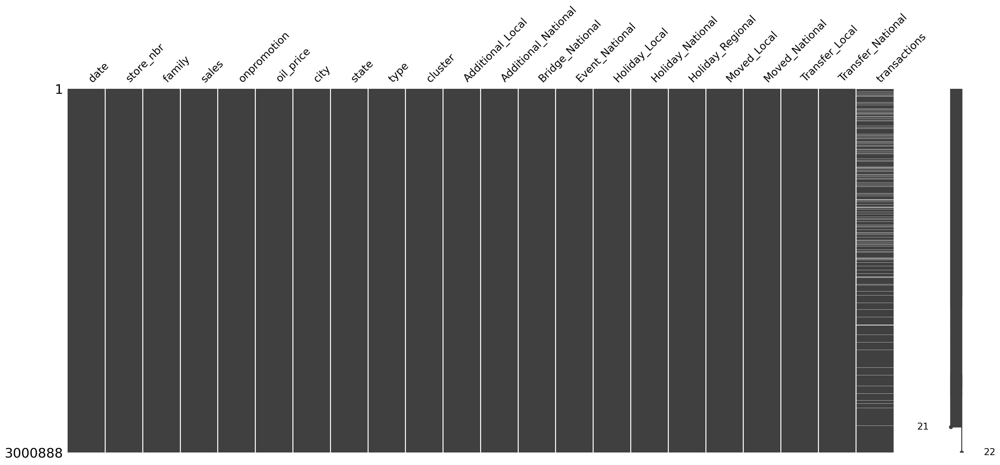

In [39]:
msno.matrix(train)

Missing information in the transactions column pushed me to start figuring out what caused it.
<br>
<br>
It is possible that some information about the number of transactions was simply lost or not recorded, but it is also possible that the missing transactions actually indicate that some stores did not conduct any transactions on certain days. More on this in the next submodule.

## Misleading data detection and handling

I assume there are 2 possible types of problems here:
<br>
1. Some stores may **not be open on certain dates** (*internal troubles* or they *weren't opened* / *were already closed* at some point).
2. Some stores may **not sell specific product families**.

Preserving such observations may lead to a worse understanding of data both by users and models. So next I'll analyze both of these problems and remove such data.

### ① Handling problems related to dates

In [40]:
set_1 = set(train.date.unique()) | set(test.date.unique())
set_2 = set(pd.date_range(start='01/01/2013', end='31/08/2017').to_series())

print(f'Dates when none of the shops were open: {sorted(list(map(lambda x: x.strftime("%Y-%m-%d"), set_2.difference(set_1))))}')

Dates when none of the shops were open: ['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']


None of the stores were working on **Christmas**

In [41]:
grouped_ds = train.groupby(['date', 'store_nbr']).sales.sum().reset_index()

Let's check when each store started operating (when first sale was made)

In [42]:
starting_day = dict()

for s in range(1, train['store_nbr'].nunique() + 1):
    temp = grouped_ds[grouped_ds['store_nbr'] == s]
    starting_day[s] = (temp['sales'] != 0).argmax()

starting_day = pd.Series(starting_day)
# starting_day.to_csv('preprocessed_datasets/starting_day.csv', index_label='store_nbr', header=['starting_day'])

starting_day + 1

1        2
2        2
3        2
4        2
5        2
6        2
7        2
8        2
9        2
10       2
11       2
12       2
13       2
14       2
15       2
16       2
17       2
18       2
19       2
20     772
21     933
22    1010
23       2
24       2
25       1
26       2
27       2
28       2
29     807
30       2
31       2
32       2
33       2
34       2
35       2
36     129
37       2
38       2
39       2
40       2
41       2
42     961
43       2
44       2
45       2
46       2
47       2
48       2
49       2
50       2
51       2
52    1567
53     513
54       2
dtype: int64

Most of the stores started operating on **January 2, 2013**, while store **#25** was working from the very beggining of **2013**.

**8** stores (**#20**, **#21**, **#22**, **#29**, **#36**, **#42**, **#52**, **#53**) were opened later.

In [43]:
grouped_ds = grouped_ds[grouped_ds['sales'] == 0]

In [44]:
temp = grouped_ds.groupby(['date'])['store_nbr'].count()
x = temp.index
y = temp.values

fig = go.Figure(data=go.Scatter(x=x, y=y, line={'color': 'darkslateblue', 'width': 2.5}, 
                                hovertemplate='Date: %{x}<br>Closed stores: %{y}<extra></extra>'),
               layout={
                   'title': 'Amount of stores with 0 sales',
                   'margin': {'l':10, 'r':10, 't':40, 'b':10}
               })

fig.update_yaxes(zeroline=True, zerolinecolor='LightPink', zerolinewidth=1.5)

fig.show()

Overall, there is declining trend in terms of the number of out-of-service stores per day.

Every year there were huge spikes on **January 1**. Only **1** or **2** (*only in 2014*) out of **54 stores** were working on the first day of each year.

From time to time, the number of closed stores increases by **1-2 units** for a period of **1 day** to **2 months** This may be due to internal problems (e.g. repairs) or unforeseen circumstances (e.g. abnormal weather conditions), but they don't have periodicity and have no fundamental significance on the dependencies in question.

The last date that we see is **April 19, 2017**, which means that none of the shops were completely closed before testing data

Let's remove pairs of **dates & stores** when such stores were not functioning

In [45]:
instances_before = train.shape[0]

merged_ds = train.reset_index().merge(grouped_ds, on=['date', 'store_nbr'], how='inner')
train = train.drop(merged_ds['index'])

cut_data_ratio = abs(1 - instances_before / train.shape[0])

print(f'{cut_data_ratio * 100:.2f}% of data was removed after cleaning!')

8.77% of data was removed after cleaning!


### ② Handling problems related to product family

Let's check if there are stores which do not offer certain product types (I consider families not presented in store if items of this family weren't sold there at all during **last 2 months** of training period)

In [46]:
grouped_sf = train[train['date'] > '2017-06-15'].groupby(['store_nbr', 'family']).sales.sum()
grouped_sf = grouped_sf[grouped_sf == 0].reset_index()

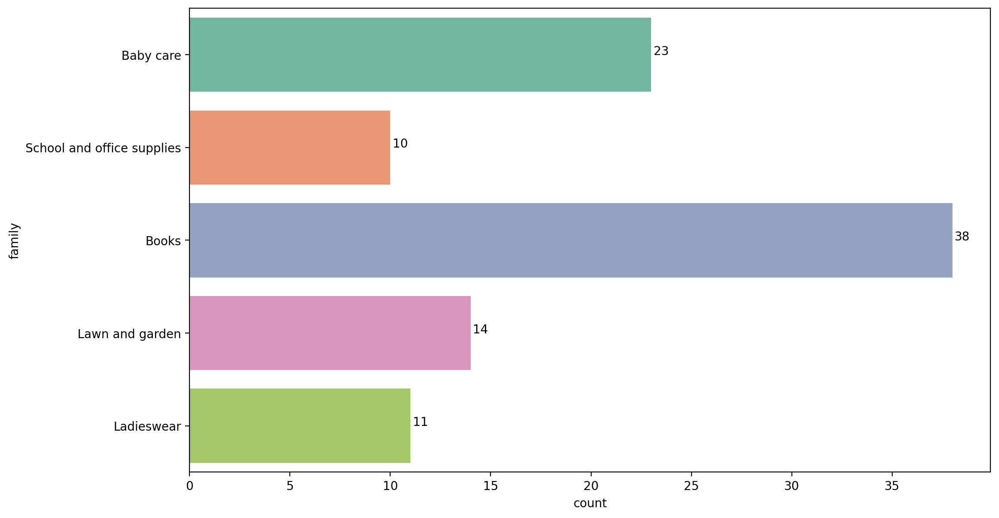

In [47]:
warnings.filterwarnings('ignore')

fig, ax = plt.subplots()

countplot = sns.countplot(y=grouped_sf['family'], palette='Set2', ax=ax)

for p in countplot.patches:
    countplot.text(p.get_width() + 0.5, p.get_y() + p.get_height() / 2,
                   str(int(p.get_width())), fontsize = 10, ha = "center")   

warnings.filterwarnings('default')

1) There were only **5** out of **33 product types** which were not present in some stores
<br>
2) Books were not sold in more than **2/3** of the shops **(38 / 54)**

In [48]:
instances_before = train.shape[0]

merged_sf = train.reset_index().merge(grouped_sf, on=['store_nbr', 'family'], how='inner')
train = train.drop(merged_sf['index'])

cut_data_ratio = abs(1 - instances_before / train.shape[0])
print(f'{cut_data_ratio * 100:.2f}% of data was removed after cleaning!')

5.72% of data was removed after cleaning!


### Verification of cleaning process

In [49]:
train.isna().sum()

date                      0
store_nbr                 0
family                    0
sales                     0
onpromotion               0
oil_price                 0
city                      0
state                     0
type                      0
cluster                   0
Additional_Local          0
Additional_National       0
Bridge_National           0
Event_National            0
Holiday_Local             0
Holiday_National          0
Holiday_Regional          0
Moved_Local               0
Moved_National            0
Transfer_Local            0
Transfer_National         0
transactions           3683
dtype: int64

<Axes: >

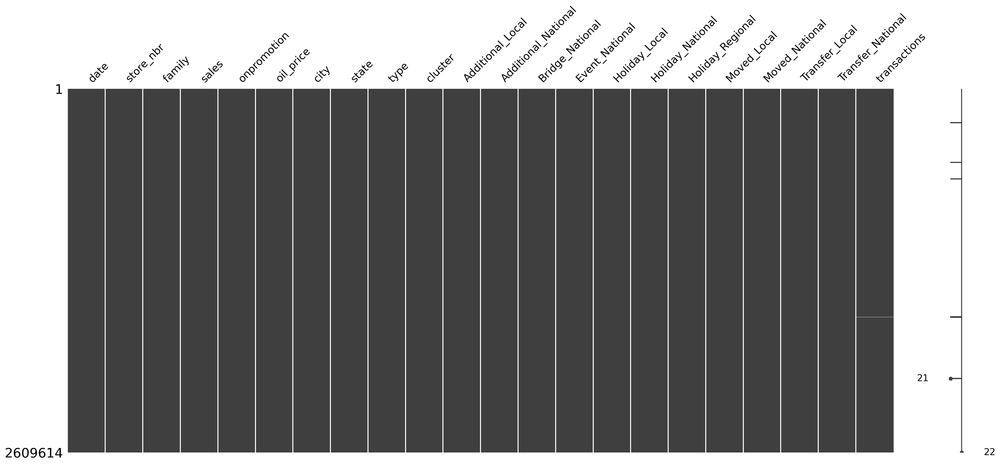

In [50]:
msno.matrix(train)

In [51]:
train[train['transactions'].isna()]

,date,store_nbr,family,sales,onpromotion,oil_price,city,state,type,cluster,...,Bridge_National,Event_National,Holiday_Local,Holiday_National,Holiday_Regional,Moved_Local,Moved_National,Transfer_Local,Transfer_National,transactions
301191,2013-06-19,10,Automotive,3.000,0,98.24,Quito,Pichincha,C,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
301193,2013-06-19,10,Beauty,0.000,0,98.24,Quito,Pichincha,C,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
301194,2013-06-19,10,Beverages,515.000,0,98.24,Quito,Pichincha,C,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
301196,2013-06-19,10,Bread/bakery,94.000,0,98.24,Quito,Pichincha,C,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
301197,2013-06-19,10,Celebration,0.000,0,98.24,Quito,Pichincha,C,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2428795,2016-09-27,7,Poultry,674.468,0,44.65,Quito,Pichincha,D,8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2428796,2016-09-27,7,Prepared foods,172.204,0,44.65,Quito,Pichincha,D,8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2428797,2016-09-27,7,Produce,5306.265,1,44.65,Quito,Pichincha,D,8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2428798,2016-09-27,7,School and office supplies,0.000,0,44.65,Quito,Pichincha,D,8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [52]:
grouped_ds = train.groupby(['date', 'store_nbr']).sales.sum()
grouped_sf = train.groupby(['store_nbr', 'family']).sales.sum()

if len(grouped_ds[grouped_ds == 0]) == 0 and len(grouped_sf[grouped_sf == 0]) == 0:
    print('Cleaning was done correctly')
else:
    print('Something went wrong')

Cleaning was done correctly


As we can see, NA transactions values that are left after useless information handling don't represent not working stores on some days and rather connected to some other issues (maybe some transactions were not recorded or were simply lost)

## ACF & PACF

In [53]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

In [54]:
grouped_fd = train.groupby(['family', 'date']).sales.mean().reset_index()

families = train['family'].unique()

fig, ax = plt.subplots(len(families), 2, figsize=(12, 112))

for i, family in enumerate(families):
    temp = grouped_fd[grouped_fd['family'] == family]['sales']
    plot_acf(temp, lags=365, ax=ax[i, 0], title=f'ACF\n{family}', zero=False)
    plot_pacf(temp, lags=365, ax=ax[i, 1], title=f'PACF\n{family}', zero=False)
    
fig.tight_layout()

I believe that for some families introduction of lag features might increace quality of predictions. I will stick with following lags:
<br>
1. **Lag 16** (smallest term which allows to use known prices in forecasting [test period = 16 days])
2. **Lag 21** (price three weeks ago)
3. **Lag 30** (price ~one month ago)
4. **Lag 60** (price ~two months ago)
5. **Lag 90** (price ~one quarter ago)
6. **Lag 181** (price ~half a year ago)
7. **Lag 363** (price ~one year ago)


P.S. Lags are little bit less than actual date related values, because I take into account that all stores are not functioning on **Christmas** and almost all don't do so on **January 1**, this data is not present/was removed manually, so there are actually less observations because of this.
<br>

These features will be created later.

## Promotion analysis

In [55]:
train_temp = train.groupby(['family'])['onpromotion'].mean()
test_temp = test.groupby(['family'])['onpromotion'].mean()

x1 = train_temp.index
y1 = train_temp.values
x2 = test_temp.index
y2 = test_temp.values

fig = go.Figure(data=[go.Bar(x=x1, y=y1, name='Train', text=list(map(lambda x: f'{x:.1f}', y1)), 
                             textposition='outside', textfont={'size': 6}, 
                             hovertemplate='Family: %{x}<br>Mean items on promotion: %{y}<extra></extra>'), 
                      go.Bar(x=x2, y=y2, name='Test', text=list(map(lambda x: f'{x:.1f}', y2)), 
                             textposition='outside', textfont={'size': 6},
                             hovertemplate='Family: %{x}<br>Mean items on promotion: %{y}<extra></extra>')],
               layout={
                   'barmode': 'group',
                   'margin': {'l':10, 'r':10, 't':40, 'b':10},
                   'title': 'Mean number of items on promotion by family',
                   'legend': {'yanchor': 'top', 'xanchor': 'right', 'x': 0.995, 'y': 0.99},
                   'xaxis': {'tickangle': 285},
                   'xaxis_title': "Family",
                   'yaxis_title': "On promotion",
                   'width': 1100,
                   'height': 600
                      },
               )

fig.show()

**Key insights from the plot above:**
1. During testing period, **average number of items on promotion is larger** than during training period
2. **Grocery 1**, **Produce**, **Beverages** and **Dairy** were being put on promotion **more than other categories**
3. **Distribution of the number of items on promotion**  across different families **is similar** between training and testing data

In [56]:
train_temp = train.groupby(['store_nbr'])['onpromotion'].mean()
test_temp = test.groupby(['store_nbr'])['onpromotion'].mean()

x1 = train_temp.index
y1 = train_temp.values
x2 = test_temp.index
y2 = test_temp.values

fig = go.Figure(data=[go.Bar(x=x1, y=y1, name='Train', marker_color='coral', hovertemplate='Store number: %{x}<br>Mean items on promotion: %{y}<extra></extra>',
                             text=list(map(lambda x: '{:.1f}'.format(x), y1)), textposition='outside', textfont={'size': 24}, cliponaxis= False), 
                      go.Bar(x=x2, y=y2, name='Test', marker_color='lightseagreen', hovertemplate='Store number: %{x}<br>Mean items on promotion: %{y}<extra></extra>',
                             text=list(map(lambda x: '{:.1f}'.format(x), y2)), textposition='outside', textfont={'size': 24}, cliponaxis=False)],
               layout={
                   'barmode': 'group',
                   'margin': {'l':10, 'r':10, 't':40, 'b':10},
                   'title': 'Mean number of items on promotion by store number',
                   'legend': {'yanchor': 'top', 'xanchor': 'right', 'x': 0.995, 'y': 0.99},
                   'xaxis': {'tickmode': 'array', 'tickvals': x1, 'tickangle': 0},
                   'xaxis_title': "Store number",
                   'yaxis_title': "On promotion",
                   'width': 1100,
                   'height': 600
                      },
               )

fig.show()

**Key insights from plot above:**
1. **All stores** (except **#52**) **increased** amount of items **on promotion** during test time
2. **Distribution of the number of items on promotion** across different stores **slightly differs** between training and testing dataset.

## Target vs Time features

In [57]:
sales_by_day = train.groupby('date').sales.mean().reset_index()

x = sales_by_day.iloc[:, 0]
y = sales_by_day.iloc[:, 1]

fig = go.Figure(data=go.Scatter(x=x, y=y, line={'color': 'springgreen', 'width': 1.5}, hovertemplate='Date: %{x}<br>Sales: %{y}<extra></extra>'),
               layout={
                   'title': 'Mean sales',
                   'margin': {'l':30, 'r':30, 't':50, 'b':30},
                   'width': 1100,
                   'height': 600
               })

fig.show()

**Key insights from plot above:**
1. There is a global **positive trend** in terms of **number of sales**

Let's see how number of sales varies depending on **day of month**, **day of week**, **month** and **year**
<br>
I'll create time features in order to analyze it

In [58]:
train['day_of_month'] = train.date.dt.day
train['day_of_week'] = train.date.dt.weekday
train['month'] = train.date.dt.month
train['year'] = train.date.dt.year

test['day_of_month'] = test.date.dt.day
test['day_of_week'] = test.date.dt.weekday
test['month'] = test.date.dt.month
test['year'] = test.date.dt.year

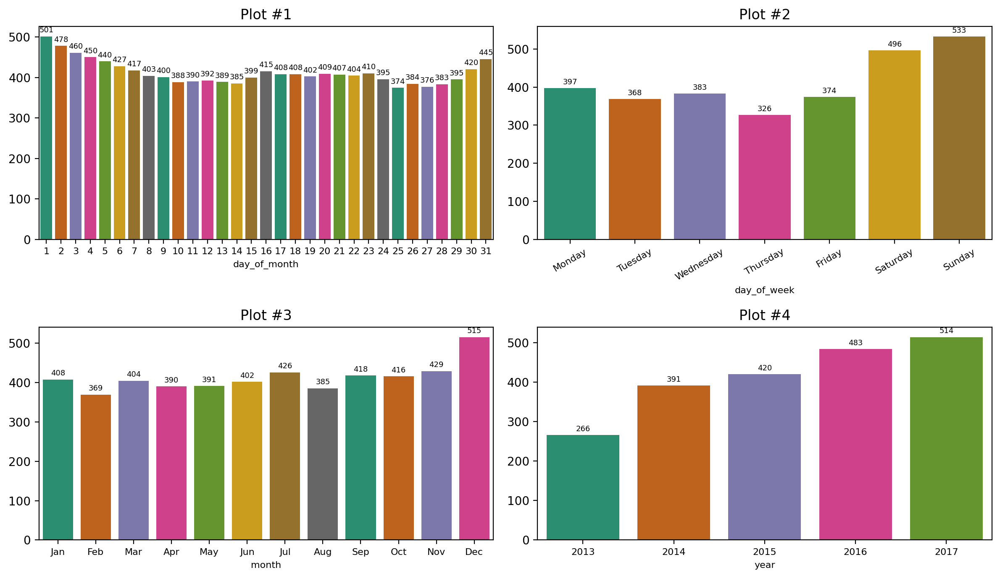

In [59]:
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(2, 2)

cols = ['day_of_month', 'day_of_week', 'month', 'year']

for i, col in enumerate(cols):
    ax_current = ax[i // 2, i % 2]
    
    temp = train.groupby(col).sales.mean()
    barplot = sns.barplot(data=temp, ax=ax_current, palette='Dark2')
    
    ax_current.set_title(f'Plot #{i + 1}')
    ax_current.set_xlabel(col, fontsize=8)
    ax_current.set_ylabel('')
    ax_current.tick_params(axis='x', which='major', labelsize=8)
    
    for p in barplot.patches:
        barplot.text(p.get_x() + p.get_width() / 2., p.get_height() + 10, 
                     str(int(p.get_height())), fontsize = 6.5, ha = "center")
        
    if col == 'day_of_week':
        ax_current.set_xticklabels(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
        ax_current.tick_params(axis='x', rotation=30)
        
    if col == 'month':
        ax_current.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

fig.tight_layout()    

warnings.filterwarnings('default')

**Key insights from the plots above:**
<br>
<br>
*Plot #1.* People spend **the most** on **1st day of month**. Then this number **declines** from day to day before it reaches middle of the month. After that the amount of sales **rises a little bit**, **drops not significantly** on **day 24**, but **starts rising** actively after **day 27**. My assumption for all these changes is that almost all people receive their salary at the very end/start of the month and some of them also receive part of their paychecks in the middle of the month.
<br>
<br>
*Plot #2.* It shows us that **the most** number of sales happen on **Saturday** and **Sunday**. **Monday**, **Tuesday**, **Wednesday** and **Friday** are pretty much the same, while there are **smaller amount** of sales on **Thursday**, but not very significantly. These are pretty logical results as people have much more free time on weekends. Maybe some people tend to spend **Saturday** in more active way and prefer to buy things on **Sunday**.
<br>
<br>
*Plot #3.* Overall, there are no big difference in number of sales between different months. The only month that stands out is **December**, but I suppose it happens because there are 2 big holidays: **Christmas** and **New Year** (well, technically it starts with **January**, but the preparation takes place in **December**).
<br>
<br>
*Plot #4.* Ecuadorians buy more every year. Difference between **2013** and **2017** is almost **2 times**, which is huge.

## Target vs Stores

In [60]:
train['state'] = train['state'].replace({'Santo Domingo de los Tsachilas': 'SD_Tsachillas'})
test['state'] = test['state'].replace({'Santo Domingo de los Tsachilas': 'SD_Tsachillas'})

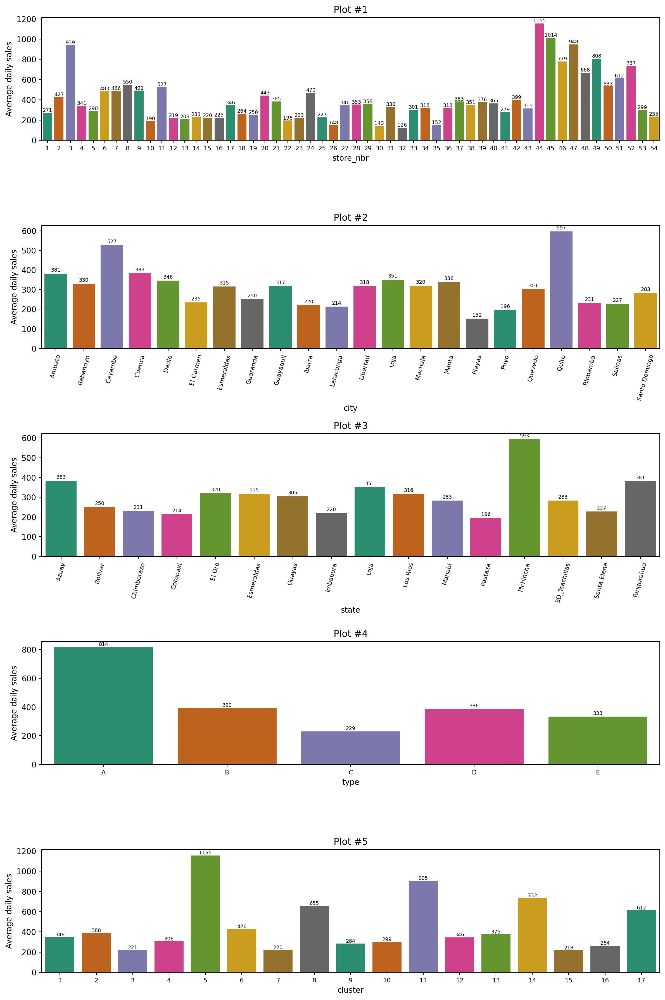

In [61]:
warnings.filterwarnings('ignore')

fig, ax = plt.subplots(5, 1, figsize=(12, 18))

cols = ['store_nbr', 'city', 'state', 'type', 'cluster']

for i, col in enumerate(cols):
    ax_current = ax[i]
    
    temp = train.groupby(col).sales.mean()
    barplot = sns.barplot(data=temp, ax=ax_current, palette='Dark2')
    
    if max(map(lambda x: len(str(x)), train[col].unique())) >= 10:
        ax_current.tick_params(axis='x', rotation=75)
    
    ax_current.set_title(f'Plot #{i + 1}')
    ax_current.set_ylabel('Average daily sales')
    ax_current.tick_params(axis='x', which='major', labelsize=8)
    
    for p in barplot.patches:
        barplot.text(p.get_x() + p.get_width() / 2., p.get_height() + 10, 
                        str(int(p.get_height())), fontsize = 6.5, ha = "center")
    
fig.tight_layout()    

warnings.filterwarnings('default')

**Key insights from plots above:**
<br>
<br>
*Plot 1.* Stores **#3**, **#44**, **#45** and **#47** **stand out the most**. **#8**, **#11**, **#46**, **#48**, **#49**, **#51** and **#52** also possess decent amount of average daily sales.
<br>
<br>
*Plot 2.* Cities **Quito** (capital of Ecuador) and **Cayambe** (city near volcano with the same name) have the **highest sales**.
<br>
<br>
*Plot 3.* State **Pichincha** (**Quito** is in this state) **dominates** other states with almost 600 average sales per day. 
<br>
<br>
*Plot 4.* Type **A tops** all other types by more than 2 times.
<br>
<br>
*Plot 5.* Cluster **5** and **11** show **the best** result. Clusters **14**, **8**, **17** come next.

## Target vs Transcations

As information about amount of **transcations** made during the day becomes available only the moment shop is closed, we can't use it as predictor in our models.

But it's still worth to look on relationships between it and sum of **sales** across all families per day.

In [62]:
from scipy import stats

temp = train.dropna().groupby(['date']).agg({'transactions': 'mean', 'sales': 'mean', 'year': lambda x: str(int(np.mean(x)))})

x1 = temp.iloc[:, 0]
y1 = temp.iloc[:, 1]
c = temp.iloc[:, 2]

a, b, r, _, _ = stats.linregress(x1, y1)

y2 = a * x1 + b

fig = px.scatter(temp, x='transactions', y='sales', color='year')

fig.add_scatter(x=x1, y=y2, line={'width': 2}, marker={'color': 'indigo'}, 
                name=f'Trend line<br><i>sales</i> = {a:.3f}*<i>transactions</i> {b:.3f}<br>R^2 = {r ** 2:.3f}', 
                hovertemplate='<b>Trend line</b><br>x=%{x}, y=%{y}<extra></extra>', hoverinfo='none')

fig.update_layout(title='Sales vs transactions',
                  margin={'l':30, 'r':30, 't':50, 'b':30},
                  legend={'yanchor': 'top', 'xanchor': 'left', 'x': 0.005, 'y': 0.99},
                  width=1100,
                  height=600)

fig.update_xaxes(showspikes=True, spikethickness=2)
fig.update_yaxes(showspikes=True, spikethickness=2)

fig.show()

**Key insights from plot above:**
1. There is positive correlation between **transactions** and mean number of **sales**

## Target vs oil_price

In [63]:
temp = train.dropna().groupby(['date']).agg({'oil_price': 'mean', 'sales': 'mean'})

x1 = temp.iloc[:, 0]
y1 = temp.iloc[:, 1]

a, b, r, _, _ = stats.linregress(x1, y1)

y2 = a * x1 + b

fig = px.scatter(temp, x='oil_price', y='sales')

fig.add_scatter(x=x1, y=y2, line={'width': 2}, marker={'color': 'lightgreen'}, 
                name=f'Trend line<br><i>sales</i> = {a:.3f}*<i>oil_price</i> + {b:.3f}<br>R^2 = {r ** 2:.3f}', 
                hovertemplate='<b>Trend line</b><br>x=%{x}, y=%{y}<extra></extra>')

fig.update_layout(title='Sales vs oil_price',
                  margin={'l':30, 'r':30, 't':50, 'b':30},
                  legend={'yanchor': 'top', 'xanchor': 'left', 'x': 0.005, 'y': 0.99},
                  width=1100,
                  height=600)

fig.update_xaxes(showspikes=True, spikethickness=2)
fig.update_yaxes(showspikes=True, spikethickness=2)

fig.show()

**Key insights from the plot above:**
1. There is negative correlation between **oil_price** and mean number of **sales**

## Correlation between factors and Target

<Axes: >

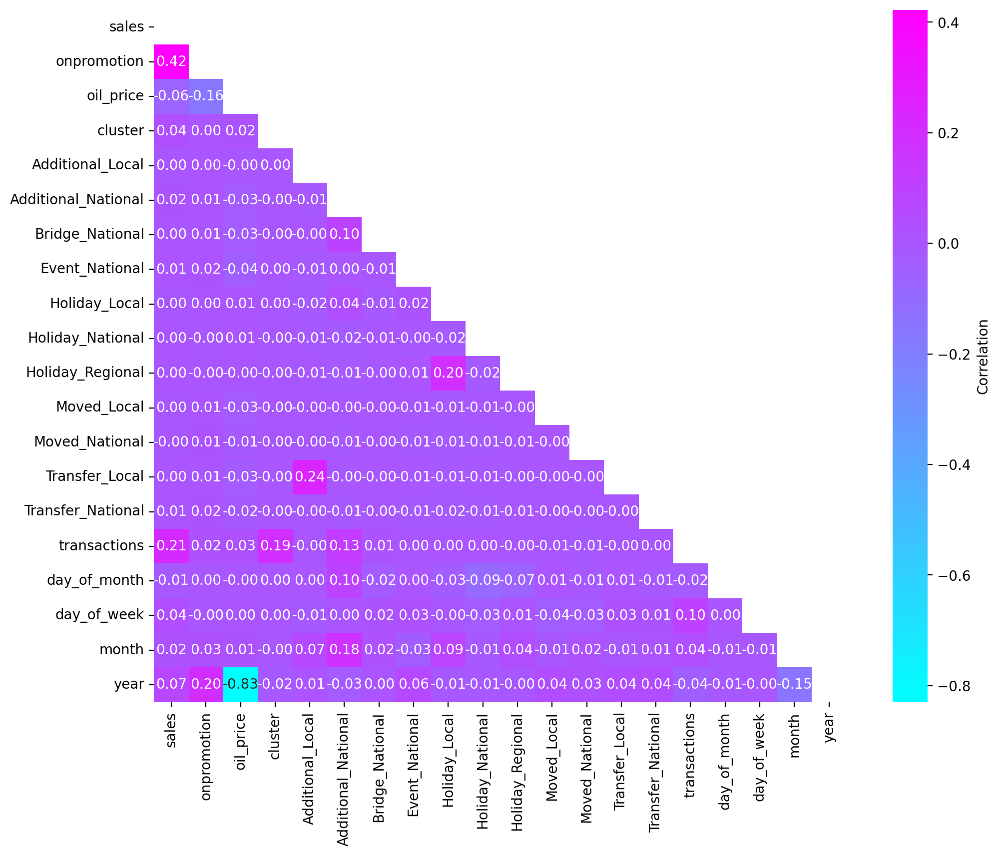

In [64]:
fig, ax = plt.subplots(figsize=(12, 9))

corr_df = train.drop(columns=['store_nbr']).corr(numeric_only=True)

sns.heatmap(corr_df, mask=np.triu(corr_df), ax=ax, cmap='cool',
            annot=True, fmt='.2f', cbar_kws={'label': 'Correlation'}, square=True)

In [65]:
from pandas.api.types import is_numeric_dtype

numeric_cols = [col for col in train if is_numeric_dtype(train[col]) and col not in ('sales', 'store_nbr')]

vif_values = pd.Series([vif(train[numeric_cols].dropna(), i) for i in range(train[numeric_cols].shape[1])], index=numeric_cols)

In [66]:
vif_values.sort_values(ascending=False)

year                   22.003544
oil_price               8.054892
month                   4.646186
cluster                 4.475366
transactions            4.419842
day_of_month            4.312437
day_of_week             3.298247
Holiday_Local           1.107711
Additional_National     1.093682
onpromotion             1.081204
Additional_Local        1.073455
Transfer_Local          1.064603
Holiday_Regional        1.056831
Event_National          1.038964
Holiday_National        1.033025
Bridge_National         1.014406
Moved_National          1.006105
Transfer_National       1.005984
Moved_Local             1.003669
dtype: float64

We can see 2 VIF values (**year ≈ 22.00**, **oil_price ≈ 8.05**) that are higher than popular heuristic *VIF > 5 => multicolinearity*

I think that both of these factors contain valuable information for predicting and it outweighs possible mild multicolinearity, so there is no need to remove them from our data.

## Datasets final cleaning before modeling & creation of **lag** and **window** features & writing

During modeling part, I want to create own dataset for every **store_nbr** and **family** combination.
<br><br>
Because of this, there is no need for features related to store (**state**, **city**, etc.) as they will repeat every observation in each such dataset. Same goes for **transactions** feature - it doesn't bring any value for forecasting as transactions are known only at the end of the day, so we can't use it for predicting.
<br><br>
I also will create **lag** and **window features**.
<br><br>
Overall, I will create **3** types of datasets for further model training and predicting:
1. Using data with all preprocessing done previously.
2. Using data with all preprocessing done previously + **lag** & **window features**.
3. Using initial data with minor modifications.

### Datasets #1 & #2

In [ ]:
train = train.drop(columns=['transactions', 'city', 'state', 'type', 'cluster'])
test = test.drop(columns=['city', 'state', 'type', 'cluster'])

train.to_csv('preprocessed_datasets/train_preprocessed.csv')
test.to_csv('preprocessed_datasets/test_preprocessed.csv')

In [ ]:
unique_sf = train.groupby(['store_nbr', 'family']).count().index.values

concatenated = pd.concat([train, test], axis=0)
concatenated = concatenated.fillna(0)

In [ ]:
import os

if not os.path.exists(f'preprocessed_datasets'):
    os.makedirs(f'preprocessed_datasets')

def save_files(df, add_text):
    if not os.path.exists(f'preprocessed_datasets/train_{add_text}'):
        os.makedirs(f'preprocessed_datasets/train_{add_text}')
    if not os.path.exists(f'preprocessed_datasets/test_{add_text}'):
        os.makedirs(f'preprocessed_datasets/test_{add_text}')
        
    train_df = df.iloc[:-16, :]
    test_df = df.iloc[-16:, :]
    test_df = test_df.drop(columns=['sales'])
    
    train_df.to_csv(f'preprocessed_datasets/train_{add_text}/s_{s}_f_{f.lower().replace("/", "_or_")}_train_{add_text}.csv')
    test_df.to_csv(f'preprocessed_datasets/test_{add_text}/s_{s}_f_{f.lower().replace("/", "_or_")}_test_{add_text}.csv')

In [ ]:
lags = [16, 21, 30, 60, 90, 181, 363]


for s, f in unique_sf:
    temp = concatenated[(concatenated['store_nbr'] == s) & (concatenated['family'] == f)]

    save_files(temp, 'base')
    
    counter = len(lags)

# I am going to use 7 as starting window size for windows features (takes into account 3 values before and 3 after wanted lag)
# and increase it by 2 (+1 before and +1 after wanted lag) every next lag
    window_size = 7
    
# As introduction of lag features cuts part of the training dataset, I want to preserve at least 2/3 of initial number of observations
# That's why I'll use only those lags for each dataset (some stores have less observations than others), which satisfies this condition.
# Window features cut more observations than lag features, namely by (window_size - 1) / 2 amount, 
# so I'll stick to this number when comparing with size of the initial dataset.

    for i in range(len(lags)-1, -1, -1):
        if (lags[i] + (window_size + (i - 1) * 2 - 1) / 2) > (temp.shape[0] - 16) / 3: 
            counter -= 1
        else:
            break
          
    lags_current = lags[:counter]
    
    for i, lag in enumerate(lags_current):
        temp.loc[:, [f'sales_lag{lag}']] = temp['sales'].shift(lag)
        if lag > 16:
            temp.loc[:, [f'sales_window{window_size + (i - 1) * 2}_lag{lag}']] = temp['sales'].rolling(window_size + (i - 1) * 2).mean().shift(int(lag - (window_size + (i - 1) * 2 - 1) / 2))

    temp = temp.dropna()
    
    save_files(temp, 'with_lags')

In [ ]:
pd.DataFrame(np.array(list(map(list, unique_sf))), columns=['store_nbr', 'family']).to_csv('preprocessed_datasets/unique_sf.csv', index=False)

### Dataset #3 

Modifications to the **initial data**:
1. I will cut off part of observations where stores didn't start operating
2. I will fill in missing values on **December 25** and 0 values on **January 1** with heuristic linear combinations of lagged sales values (**lag 7** and **14**) in order to smooth time series.

I am going to use this dataset with **econometric models**.

In [13]:
train_initial = pd.read_csv('initial_datasets/train.csv', index_col='date', parse_dates=True)

unique_sf = pd.read_csv('preprocessed_datasets/unique_sf.csv').values

starting_day = pd.read_csv('preprocessed_datasets/starting_day.csv', index_col=0)['starting_day']

grouped_ds = train_initial.groupby(['date', 'store_nbr']).sales.sum().reset_index()

for s, f in unique_sf:
    temp = train_initial[(train_initial['store_nbr'] == s) & (train_initial['family'] == f.upper())]
    temp = temp.iloc[starting_day[s]:, :]
    temp = temp.resample('1D').asfreq()

    temp['shift-7'] = temp['sales'].shift(-7)
    temp['shift-14'] = temp['sales'].shift(-14)

    temp['shift+7'] = temp['sales'].shift(7)
    temp['shift+14'] = temp['sales'].shift(14)

    temp.loc[temp[temp.index.strftime('%m-%d') == '12-25'].index, 'sales'] = temp['shift+7'] * 0.5 + temp['shift+14'] * 0.2 + temp['shift-14'] * 0.3

    # store #25 is the only one that works on January 1.
    if s != 25:
        temp.loc[temp[temp.index.strftime('%m-%d') == '01-01'].index, 'sales'] = temp['shift+14'] * 0.3 + temp['shift-7'] * 0.5 + temp['shift-14'] * 0.2

    if not os.path.exists(f'preprocessed_datasets/train_initial'):
        os.makedirs(f'preprocessed_datasets/train_initial')
    
    temp['sales'].to_csv(f'preprocessed_datasets/train_initial/s_{s}_f_{f.lower().replace("/", "_or_")}_train_initial.csv')

                   id  store_nbr      family  sales  onpromotion  shift-7  \
date                                                                        
2013-01-02     1782.0        1.0  AUTOMOTIVE    2.0          0.0      2.0   
2013-01-03     3564.0        1.0  AUTOMOTIVE    3.0          0.0      2.0   
2013-01-04     5346.0        1.0  AUTOMOTIVE    3.0          0.0      3.0   
2013-01-05     7128.0        1.0  AUTOMOTIVE    5.0          0.0      2.0   
2013-01-06     8910.0        1.0  AUTOMOTIVE    2.0          0.0      2.0   
...               ...        ...         ...    ...          ...      ...   
2017-08-11  2991978.0        1.0  AUTOMOTIVE    1.0          0.0      NaN   
2017-08-12  2993760.0        1.0  AUTOMOTIVE    6.0          0.0      NaN   
2017-08-13  2995542.0        1.0  AUTOMOTIVE    1.0          0.0      NaN   
2017-08-14  2997324.0        1.0  AUTOMOTIVE    1.0          0.0      NaN   
2017-08-15  2999106.0        1.0  AUTOMOTIVE    4.0          0.0      NaN   

## Bonus. Interactive plots for each store and family

In [67]:
train = pd.read_csv('initial_datasets/train.csv', index_col=0, parse_dates=['date'])

### Days when stores weren't operating

Store number:  21


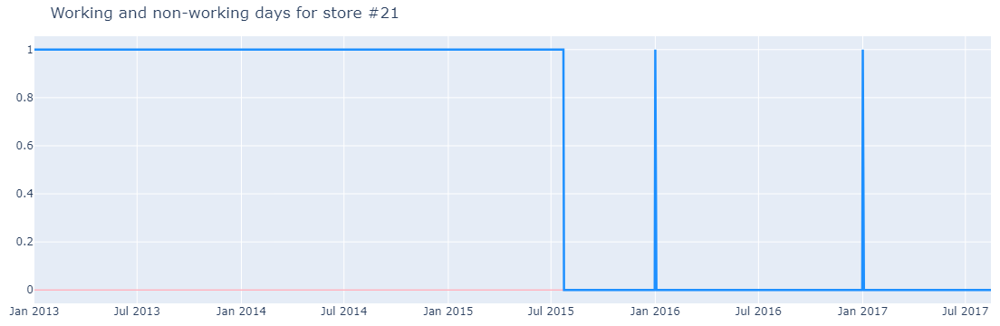

In [74]:
s = int(input(f'Store number: '))

if s < 1 or s > 54:
    print('Store numbers are between 1 and 54. Try again!')
else:
    grouped_ds = train[train['store_nbr'] == s].groupby('date').sales.sum().reset_index()
    
    x = grouped_ds['date'].dt.strftime('%Y-%m-%d').values
    y = np.where(grouped_ds['sales'] == 0, 1, 0)
    
    fig = go.Figure(data=go.Scatter(x=x, y=y, line={'color': 'dodgerblue', 'width': 2.5},
                                    hovertext=[f'Date: {x[i]}<br>' + ['Working', 'Not working'][y[i]] for i in range(x.shape[0])], hoverinfo='text'),
                   layout={
                       'title': f'Working and non-working days for store #{s}',
                       'margin': {'l':10, 'r':10, 't':40, 'b':10}
                   })
    
    fig.update_yaxes(zeroline=True, zerolinecolor='LightPink', zerolinewidth=1.5)
    
    fig.show()

### Sales of different combinations of store and family

Store number (from 1 to 54) or "all":  28
Family. You can write either number (from 1 to 33), name (like automotive or seafood) or "all":  grocery i


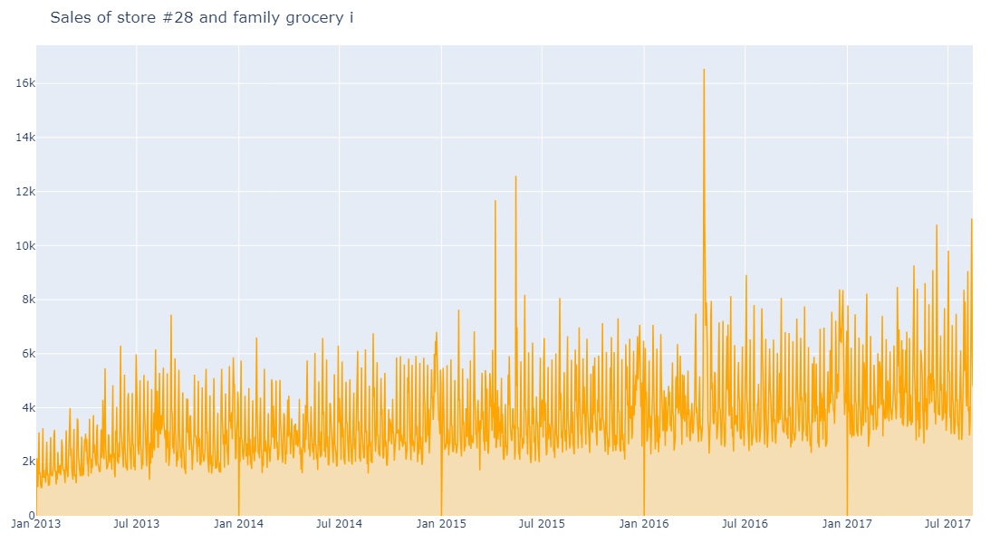

In [77]:
s = input(f'Store number (from 1 to 54) or "all": ')
f = input(f'Family. You can write either number (from 1 to 33), name (like automotive or seafood) or "all": ')

if not s.isdigit() and s.lower() != 'all':
    print('Store number is either integer between 1 and 54 or "all". Try again!')
elif s.isdigit() and (int(s) < 1 or int(s) > 54):
    print('Store numbers are intergers between 1 and 54. Try again!')
elif not f.isdigit() and f.upper() not in train['family'].unique() and f.lower() != 'all':
    print('Family is either integer between 1 and 33, specific family name or "all". Try again!')
elif f.isdigit() and (int(f) < 1 or int(f) > 33):
    print('Family numbers are between 1 and 33. Try again!')
else:
    if s.isdigit():
        s = int(s)
        temp = train[train['store_nbr'] == s]
        title = f'Sales of store #{s}'
    else:
        temp = train
        title = 'Mean sales'
        
    if f.isdigit():
        f = int(f)
        f = train['family'].unique()[f - 1]
        sales_by_day = temp[temp['family'] == f].groupby('date')['sales'].mean().reset_index()

        if 'store' in title:
            title += f' and family {f.lower()}'
        else:
            title += f' of family {f.lower()}'
    elif f.lower() == 'all':
        sales_by_day = temp.groupby('date').sales.mean().reset_index()

        if 'store' in title:
            title = 'Mean s' + title[1:]
    else:
        f = f.upper()
        sales_by_day = temp[temp['family'] == f].groupby('date')['sales'].mean().reset_index()

        if 'store' in title:
            title += f' and family {f.lower()}'
        else:
            title += f' of family {f.lower()}'
            
    x = sales_by_day.iloc[:, 0]
    y = sales_by_day.iloc[:, 1]

    fig = go.Figure(data=go.Scatter(x=x, y=y, line={'color': 'orange', 'width': 1.5}, hovertemplate='Date: %{x}<br>Sales: %{y}<extra></extra>',
                                   fill='tozeroy', fillcolor='wheat'),
                   layout={
                       'title': title,
                       'margin': {'l':30, 'r':30, 't':50, 'b':30},
                       'width': 1100,
                       'height': 600
                   })
    
    fig.show()